In [0]:
%pip install tzwhere
%pip install geopandas
%pip install pyspark_dist_explore

Python interpreter will be restarted.
  Created wheel for tzwhere: filename=tzwhere-3.0.3-py3-none-any.whl size=23742600 sha256=2d4784d0e61c7d15d931e8249dc6a04f8ee84f49ab155ca0e39537f5896dee83
  Stored in directory: /home/spark-505a8b79-bff3-4c4a-bdac-1d/.cache/pip/wheels/1c/5b/38/2c0772ba05aa51fefb242a15ed85fb649990712901b6c80458
Successfully built tzwhere
Python interpreter will be restarted.
Python interpreter will be restarted.
Python interpreter will be restarted.
Python interpreter will be restarted.
Python interpreter will be restarted.


In [0]:
from pyspark.sql.functions import *
from pyspark.sql import *
from pyspark.sql.types import IntegerType, StringType
from pyspark.ml.regression import (
    LinearRegression,
    RandomForestRegressor,
    DecisionTreeRegressor,
    GBTRegressor,
)
from pyspark.ml.classification import (
    DecisionTreeClassifier,
    RandomForestClassifier,
    GBTClassifier,
)
from pyspark.ml.feature import (
    VectorAssembler,
    StandardScaler,
    MinMaxScaler,
    StringIndexer,
    OneHotEncoder,
)
from pyspark.ml.stat import Correlation
from pyspark.ml.tuning import ParamGridBuilder
from pyspark.ml.evaluation import (
    RegressionEvaluator,
    MulticlassClassificationEvaluator,
    BinaryClassificationEvaluator,
)
from pyspark.ml import Pipeline
import numpy as np
import plotly
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import datetime as dt
import itertools
import re
import pytz

# from tzwhere import tzwhere
# import geopandas as gpd
# import pyspark_dist_explore as psgraph
BACKGROUND = "black"
FOREGROUND = "#73F9CB"

# Estimated Time of Delay ✈ 
## ML Based Flight Departure Delay Prediction 
### W261 Final Project Phase 2
### Section 7 - Group1 - Team 24
### Feature Families EDA

### Blob Storage 
<div>
  <table>
    <tr> <td><img src="https://media3.giphy.com/media/y2WVrfoLeD8yMaNxr5/200w.gif?cid=6c09b952y454jw98c0kz8dej0pzbgme3klo72toxv1ycwut7&rid=200w.gif&ct=g" width=150%></td> <td>The following cell will allow users to read and write from and Azure Binary Large Object (BLOB) cloud storage container that was configured to be accessible to all team members. The 'blob_url' path generated from this code is used subsequently for caching the results of slow operations like the joining of the full weather and flights data set and saving the cross validation time series splits.</td>   
      
  </table>
</div>

In [0]:
blob_container = (
    "###"  # The name of your container created in https://portal.azure.com
)
storage_account = "###"  # The name of your Storage account created in https://portal.azure.com
secret_scope = "###"  # The name of the scope created in your local computer using the Databricks CLI
secret_key = "###"  # saskey The name of the secret key created in your local computer using the Databricks CLI
blob_url = f"wasbs://{blob_container}@{storage_account}.blob.core.windows.net"
mount_path = "/mnt/mids-w261"

spark.conf.set(
    f"fs.azure.sas.{blob_container}.{storage_account}.blob.core.windows.net",
    dbutils.secrets.get(scope=secret_scope, key=secret_key),
)

**Load the dataset with engineered features from the BLOB container**

In [0]:
data = spark.read.parquet(f"{blob_url}/final_data_phase4_3_Dec")


# Let's ensure there are no duplicates
data = data.dropDuplicates()
# dbutils.data.summarize(data)

This is a summary EDA of the full data with engineered features.

In [0]:
dbutils.data.summarize(data)

In [0]:
data.printSchema()

root
 |-- _utc_dept_ts: timestamp (nullable = true)
 |-- _utc_dept_minus2_ts: timestamp (nullable = true)
 |-- _utc_dept_actual_ts: timestamp (nullable = true)
 |-- _utc_arr_ts: timestamp (nullable = true)
 |-- _utc_arr_actual_ts: timestamp (nullable = true)
 |-- _dep_time_str: string (nullable = true)
 |-- _local_dept_ts: timestamp (nullable = true)
 |-- _local_dept_minus2_ts: timestamp (nullable = true)
 |-- _local_dept_actual_ts: timestamp (nullable = true)
 |-- _local_at_src_airport_arr_ts: timestamp (nullable = true)
 |-- _local_at_src_airport_arr_actual_ts: timestamp (nullable = true)
 |-- QUARTER: integer (nullable = true)
 |-- MONTH: integer (nullable = true)
 |-- DAY_OF_MONTH: integer (nullable = true)
 |-- DAY_OF_WEEK: integer (nullable = true)
 |-- FL_DATE: string (nullable = true)
 |-- OP_UNIQUE_CARRIER: string (nullable = true)
 |-- OP_CARRIER_AIRLINE_ID: integer (nullable = true)
 |-- OP_CARRIER: string (nullable = true)
 |-- TAIL_NUM: string (nullable = true)
 |-- OP_CAR

### List of Family Features
  
The family of features explored from the full data set prior cleaning are as follows: 
- **Arriving/Departing Flight** - features describing the flight characteristics such as time of arrival and departure dates and times, traffic conditions, delay and cancellation statuses
- **Airport of Origin/Destination** - features describing airport characteristics such as the ID, name, type, and location of origin and destination of each flight records
- **Airplane/Airline** - features identifying airline and airplane
- **Weather** - features describing physical characteristics of weather conditions during the flight
- **Engineered Flight/Airport features** - features not in original data set but found to have stonger correlation with the target variable for better modeling. These are further discussed in sections 3.3 and 3.4.

<img src ='https://github.com/noriiii/W261_Final_Project_NB/blob/main/FeaturesFamily.png?raw=true'>

Divide the full data into chunks of data frames based on family features

In [0]:
# List of Family Features

data_engineered = data[
    "origin_page_rank",
    "Dest_page_rank",
    "inbound_dep_delay_time",
    "fraction_delayed_last_4hrs",
    "Delays_last_4hrs",
    "days_to_next_holiday",
]


data_flight = data[
    "_utc_dept_ts",
    "_utc_dept_minus2_ts",
    "_utc_dept_actual_ts",
    "_utc_arr_ts",
    "_utc_arr_actual_ts",
    "_dep_time_str",
    "_local_dept_ts",
    "_local_dept_minus2_ts",
    "_local_dept_actual_ts",
    "_local_at_src_airport_arr_ts",
    "_local_at_src_airport_arr_actual_ts",
    "QUARTER",
    "MONTH",
    "DAY_OF_MONTH",
    "DAY_OF_WEEK",
    "FL_DATE",
    "YEAR",
    "origin_traffic",
    "traffic_date",
    "traffic",
    "volume_sigma",
    "CRS_DEP_TIME",
    "DEP_TIME",
    "DEP_DELAY",
    "DEP_DELAY_NEW",
    "DEP_DEL15",
    "DEP_DELAY_GROUP",
    "DEP_TIME_BLK",
    "TAXI_OUT",
    "WHEELS_OFF",
    "WHEELS_ON",
    "TAXI_IN",
    "CRS_ARR_TIME",
    "ARR_TIME",
    "ARR_DELAY",
    "ARR_DELAY_NEW",
    "ARR_DEL15",
    "ARR_DELAY_GROUP",
    "ARR_TIME_BLK",
    "CANCELLED",
    "CANCELLATION_CODE",
    "DIVERTED",
    "CRS_ELAPSED_TIME",
    "ACTUAL_ELAPSED_TIME",
    "AIR_TIME",
    "FLIGHTS",
    "DISTANCE",
    "DISTANCE_GROUP",
    "CARRIER_DELAY",
    "WEATHER_DELAY",
    "NAS_DELAY",
    "SECURITY_DELAY",
    "LATE_AIRCRAFT_DELAY",
    "FIRST_DEP_TIME",
    "TOTAL_ADD_GTIME",
    "LONGEST_ADD_GTIME",
]

data_airport = data[
    "ORIGIN_AIRPORT_ID",
    "ORIGIN_AIRPORT_SEQ_ID",
    "ORIGIN_CITY_MARKET_ID",
    "ORIGIN",
    "ORIGIN_CITY_NAME",
    "ORIGIN_STATE_ABR",
    "ORIGIN_STATE_FIPS",
    "ORIGIN_STATE_NM",
    "ORIGIN_WAC",
    "DEST_AIRPORT_ID",
    "DEST_AIRPORT_SEQ_ID",
    "DEST_CITY_MARKET_ID",
    "DEST",
    "DEST_CITY_NAME",
    "DEST_STATE_ABR",
    "DEST_STATE_FIPS",
    "DEST_STATE_NM",
    "DEST_WAC",
    "origin_airport_iata",
    "origin_airport_tz",
    "origin_airport_type",
    "origin_airport_elevation",
    "origin_airport_iso_country",
    "origin_airport_iso_region",
    "origin_airport_ws_station_id",
    "dest_airport_iata",
    "dest_airport_tz",
    "dest_airport_type",
    "dest_airport_elevation",
    "dest_airport_iso_country",
    "dest_airport_iso_region",
    "dest_airport_ws_station_id",
]

data_airplane = data[
    "OP_UNIQUE_CARRIER",
    "OP_CARRIER_AIRLINE_ID",
    "OP_CARRIER",
    "TAIL_NUM",
    "OP_CARRIER_FL_NUM",
]

data_weather = data[
    "origin_weather_Station",
    "origin_weather_Datehour",
    "origin_weather_Avg_Elevation",
    "origin_weather_Avg_HourlyAltimeterSetting",
    "origin_weather_Avg_HourlyDewPointTemperature",
    "origin_weather_Avg_HourlyDryBulbTemperature",
    "origin_weather_Avg_HourlyPressureChange",
    "origin_weather_Avg_HourlyRelativeHumidity",
    "origin_weather_Avg_HourlySeaLevelPressure",
    "origin_weather_Avg_HourlyStationPressure",
    "origin_weather_Avg_HourlyVisibility",
    "origin_weather_Avg_HourlyWetBulbTemperature",
    "origin_weather_Avg_HourlyWindDirection",
    "origin_weather_Avg_HourlyWindGustSpeed",
    "origin_weather_Avg_HourlyWindSpeed",
    "origin_weather_Avg_Precip_Double",
    "origin_weather_Trace_Rain",
    "origin_weather_NonZero_Rain",
    "origin_weather_HourlyPressureTendency_Increasing",
    "origin_weather_HourlyPressureTendency_Decreasing",
    "origin_weather_HourlyPressureTendency_Constant",
    "origin_weather_Calm_Winds",
    "origin_weather_Sky_Conditions_CLR",
    "origin_weather_Sky_Conditions_FEW",
    "origin_weather_Sky_Conditions_SCT",
    "origin_weather_Sky_Conditions_BKN",
    "origin_weather_Sky_Conditions_OVC",
    "origin_weather_Sky_Conditions_VV",
    "origin_weather_Present_Weather_Drizzle",
    "origin_weather_Present_Weather_Rain",
    "origin_weather_Present_Weather_Snow",
    "origin_weather_Present_Weather_SnowGrains",
    "origin_weather_Present_Weather_IceCrystals",
    "origin_weather_Present_Weather_Hail",
    "origin_weather_Present_Weather_Mist",
    "origin_weather_Present_Weather_Fog",
    "origin_weather_Present_Weather_Smoke",
    "origin_weather_Present_Weather_Dust",
    "origin_weather_Present_Weather_Haze",
    "origin_weather_Present_Weather_Storm",
    "dest_weather_Station",
    "dest_weather_Datehour",
    "dest_weather_Avg_Elevation",
    "dest_weather_Avg_HourlyAltimeterSetting",
    "dest_weather_Avg_HourlyDewPointTemperature",
    "dest_weather_Avg_HourlyDryBulbTemperature",
    "dest_weather_Avg_HourlyPressureChange",
    "dest_weather_Avg_HourlyRelativeHumidity",
    "dest_weather_Avg_HourlySeaLevelPressure",
    "dest_weather_Avg_HourlyStationPressure",
    "dest_weather_Avg_HourlyVisibility",
    "dest_weather_Avg_HourlyWetBulbTemperature",
    "dest_weather_Avg_HourlyWindDirection",
    "dest_weather_Avg_HourlyWindGustSpeed",
    "dest_weather_Avg_HourlyWindSpeed",
    "dest_weather_Avg_Precip_Double",
    "dest_weather_Trace_Rain",
    "dest_weather_NonZero_Rain",
    "dest_weather_HourlyPressureTendency_Increasing",
    "dest_weather_HourlyPressureTendency_Decreasing",
    "dest_weather_HourlyPressureTendency_Constant",
    "dest_weather_Calm_Winds",
    "dest_weather_Sky_Conditions_CLR",
    "dest_weather_Sky_Conditions_FEW",
    "dest_weather_Sky_Conditions_SCT",
    "dest_weather_Sky_Conditions_BKN",
    "dest_weather_Sky_Conditions_OVC",
    "dest_weather_Sky_Conditions_VV",
    "dest_weather_Present_Weather_Drizzle",
    "dest_weather_Present_Weather_Rain",
    "dest_weather_Present_Weather_Snow",
    "dest_weather_Present_Weather_SnowGrains",
    "dest_weather_Present_Weather_IceCrystals",
    "dest_weather_Present_Weather_Hail",
    "dest_weather_Present_Weather_Mist",
    "dest_weather_Present_Weather_Fog",
    "dest_weather_Present_Weather_Smoke",
    "dest_weather_Present_Weather_Dust",
    "dest_weather_Present_Weather_Haze",
    "dest_weather_Present_Weather_Storm",
]

In [0]:
display(data_engineered)

origin_page_rank,Dest_page_rank,inbound_dep_delay_time,fraction_delayed_last_4hrs,Delays_last_4hrs,days_to_next_holiday
6.8403076E-4,0.08294136,-2.0,0.3333333333333333,0.3333333333333333,71
6.8403076E-4,0.034442786,-6.0,0.0,0.0,2
6.8403076E-4,0.0758783,-4.0,0.0,0.0,53
6.8403076E-4,0.0758783,-5.0,0.0,0.0,33
6.8403076E-4,0.0758783,-1.0,0.0,0.0,23
6.8403076E-4,0.0758783,-5.0,0.0,0.0,33
6.8403076E-4,0.034442786,-8.0,0.5,0.5,2
6.8403076E-4,0.034442786,-3.0,0.0,0.0,18
6.8403076E-4,0.08294136,5.0,0.0,0.0,13
6.8403076E-4,0.0758783,-3.0,0.0,0.0,8


In [0]:
dbutils.data.summarize(data_engineered)

<!DOCTYPE html>

In [0]:
display(data_flight)

_utc_dept_ts,_utc_dept_minus2_ts,_utc_dept_actual_ts,_utc_arr_ts,_utc_arr_actual_ts,_dep_time_str,_local_dept_ts,_local_dept_minus2_ts,_local_dept_actual_ts,_local_at_src_airport_arr_ts,_local_at_src_airport_arr_actual_ts,QUARTER,MONTH,DAY_OF_MONTH,DAY_OF_WEEK,FL_DATE,YEAR,origin_traffic,traffic_date,traffic,volume_sigma,CRS_DEP_TIME,DEP_TIME,DEP_DELAY,DEP_DELAY_NEW,DEP_DEL15,DEP_DELAY_GROUP,DEP_TIME_BLK,TAXI_OUT,WHEELS_OFF,WHEELS_ON,TAXI_IN,CRS_ARR_TIME,ARR_TIME,ARR_DELAY,ARR_DELAY_NEW,ARR_DEL15,ARR_DELAY_GROUP,ARR_TIME_BLK,CANCELLED,CANCELLATION_CODE,DIVERTED,CRS_ELAPSED_TIME,ACTUAL_ELAPSED_TIME,AIR_TIME,FLIGHTS,DISTANCE,DISTANCE_GROUP,CARRIER_DELAY,WEATHER_DELAY,NAS_DELAY,SECURITY_DELAY,LATE_AIRCRAFT_DELAY,FIRST_DEP_TIME,TOTAL_ADD_GTIME,LONGEST_ADD_GTIME
2015-01-03T02:31:00.000+0000,2015-01-03T00:31:00.000+0000,2015-01-03T02:45:00.000+0000,2015-01-03T04:16:00.000+0000,2015-01-03T04:20:00.000+0000,203100,2015-01-02T20:31:00.000+0000,2015-01-02T18:31:00.000+0000,2015-01-02T20:45:00.000+0000,2015-01-02T22:16:00.000+0000,2015-01-02T22:20:00.000+0000,1,1,2,5,2015-01-02,2015,BIS,2015-01-02,10,0.25812389396646046,2031,2045,14.0,14.0,0.0,0,2000-2059,8.0,2053,2111,9.0,2116,2120,4.0,4.0,0.0,0,2100-2159,0.0,null,0.0,105.0,95.0,78.0,1.0,516.0,3,null,null,null,null,null,null,null,null
2015-01-08T12:27:00.000+0000,2015-01-08T10:27:00.000+0000,2015-01-08T12:21:00.000+0000,2015-01-08T14:20:00.000+0000,2015-01-08T14:14:00.000+0000,062700,2015-01-08T06:27:00.000+0000,2015-01-08T04:27:00.000+0000,2015-01-08T06:21:00.000+0000,2015-01-08T08:20:00.000+0000,2015-01-08T08:14:00.000+0000,1,1,8,4,2015-01-08,2015,BIS,2015-01-08,11,0.6107001743469302,627,621,-6.0,0.0,0.0,-1,0600-0659,28.0,649,706,8.0,720,714,-6.0,0.0,0.0,-1,0700-0759,0.0,null,0.0,113.0,113.0,77.0,1.0,516.0,3,null,null,null,null,null,null,null,null
2015-03-08T11:27:00.000+0000,2015-03-08T09:27:00.000+0000,2015-03-08T11:26:00.000+0000,2015-03-08T13:18:00.000+0000,2015-03-08T13:13:00.000+0000,062700,2015-03-08T06:27:00.000+0000,2015-03-08T04:27:00.000+0000,2015-03-08T06:26:00.000+0000,2015-03-08T08:18:00.000+0000,2015-03-08T08:13:00.000+0000,1,3,8,7,2015-03-08,2015,BIS,2015-03-08,10,0.25812389396646046,627,626,-1.0,0.0,0.0,-1,0600-0659,19.0,645,703,10.0,718,713,-5.0,0.0,0.0,-1,0700-0759,0.0,null,0.0,111.0,107.0,78.0,1.0,516.0,3,null,null,null,null,null,null,null,null
2015-04-01T18:50:00.000+0000,2015-04-01T16:50:00.000+0000,2015-04-01T18:49:00.000+0000,2015-04-01T21:05:00.000+0000,2015-04-01T20:49:00.000+0000,135000,2015-04-01T13:50:00.000+0000,2015-04-01T11:50:00.000+0000,2015-04-01T13:49:00.000+0000,2015-04-01T16:05:00.000+0000,2015-04-01T15:49:00.000+0000,2,4,1,3,2015-04-01,2015,BIS,2015-04-01,10,0.25812389396646046,1350,1349,-1.0,0.0,0.0,-1,1300-1359,14.0,1403,1538,11.0,1605,1549,-16.0,0.0,0.0,-2,1600-1659,0.0,null,0.0,135.0,120.0,95.0,1.0,716.0,3,null,null,null,null,null,null,null,null
2015-04-17T11:27:00.000+0000,2015-04-17T09:27:00.000+0000,null,2015-04-17T13:08:00.000+0000,null,062700,2015-04-17T06:27:00.000+0000,2015-04-17T04:27:00.000+0000,null,2015-04-17T08:08:00.000+0000,null,2,4,17,5,2015-04-17,2015,BIS,2015-04-17,10,0.25812389396646046,627,null,null,null,null,null,0600-0659,null,null,null,null,708,null,null,null,null,null,0700-0759,1.0,B,0.0,101.0,null,null,1.0,516.0,3,null,null,null,null,null,null,null,null
2015-04-22T12:50:00.000+0000,2015-04-22T10:50:00.000+0000,2015-04-22T12:39:00.000+0000,2015-04-22T14:18:00.000+0000,2015-04-22T14:20:00.000+0000,075000,2015-04-22T07:50:00.000+0000,2015-04-22T05:50:00.000+0000,2015-04-22T07:39:00.000+0000,2015-04-22T09:18:00.000+0000,2015-04-22T09:20:00.000+0000,2,4,22,3,2015-04-22,2015,BIS,2015-04-22,11,0.6107001743469302,750,739,-11.0,0.0,0.0,-1,0700-0759,18.0,757,856,24.0,918,920,2.0,2.0,0.0,0,0900-0959,0.0,null,0.0,88.0,101.0,59.0,1.0,386.0,2,null,null,null,null,null,null,null,null
2015-05-10T18:09:00.000+0000,2015-05-10T16:09:00.000+0000,2015-05-10T19:20:00.000+0000,2015-05-10T19:51:00.000+0000,2015-05-10T20:59:00.000+0000,130900,2

In [0]:
dbutils.data.summarize(data_flight)

<!DOCTYPE html>

In [0]:
display(data_airport)

ORIGIN_AIRPORT_ID,ORIGIN_AIRPORT_SEQ_ID,ORIGIN_CITY_MARKET_ID,ORIGIN,ORIGIN_CITY_NAME,ORIGIN_STATE_ABR,ORIGIN_STATE_FIPS,ORIGIN_STATE_NM,ORIGIN_WAC,DEST_AIRPORT_ID,DEST_AIRPORT_SEQ_ID,DEST_CITY_MARKET_ID,DEST,DEST_CITY_NAME,DEST_STATE_ABR,DEST_STATE_FIPS,DEST_STATE_NM,DEST_WAC,origin_airport_iata,origin_airport_tz,origin_airport_type,origin_airport_elevation,origin_airport_iso_country,origin_airport_iso_region,origin_airport_ws_station_id,dest_airport_iata,dest_airport_tz,dest_airport_type,dest_airport_elevation,dest_airport_iso_country,dest_airport_iso_region,dest_airport_ws_station_id
10135,1013503,30135,ABE,"Allentown/Bethlehem/Easton, PA",PA,42,Pennsylvania,23,13930,1393003,30977,ORD,"Chicago, IL",IL,17,Illinois,41,ABE,America/New_York,medium_airport,393,US,US-PA,72517014737,ORD,America/Chicago,large_airport,672,US,US-IL,72530094846
10135,1013503,30135,ABE,"Allentown/Bethlehem/Easton, PA",PA,42,Pennsylvania,23,11433,1143302,31295,DTW,"Detroit, MI",MI,26,Michigan,43,ABE,America/New_York,medium_airport,393,US,US-PA,72517014737,DTW,America/Detroit,large_airport,645,US,US-MI,72537094847
10135,1013503,30135,ABE,"Allentown/Bethlehem/Easton, PA",PA,42,Pennsylvania,23,10397,1039705,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,ABE,America/New_York,medium_airport,393,US,US-PA,72517014737,ATL,America/New_York,large_airport,1026,US,US-GA,72219013874
10135,1013503,30135,ABE,"Allentown/Bethlehem/Easton, PA",PA,42,Pennsylvania,23,10397,1039705,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,ABE,America/New_York,medium_airport,393,US,US-PA,72517014737,ATL,America/New_York,large_airport,1026,US,US-GA,72219013874
10135,1013503,30135,ABE,"Allentown/Bethlehem/Easton, PA",PA,42,Pennsylvania,23,10397,1039705,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,ABE,America/New_York,medium_airport,393,US,US-PA,72517014737,ATL,America/New_York,large_airport,1026,US,US-GA,72219013874
10135,1013503,30135,ABE,"Allentown/Bethlehem/Easton, PA",PA,42,Pennsylvania,23,10397,1039705,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,ABE,America/New_York,medium_airport,393,US,US-PA,72517014737,ATL,America/New_York,large_airport,1026,US,US-GA,72219013874
10135,1013503,30135,ABE,"Allentown/Bethlehem/Easton, PA",PA,42,Pennsylvania,23,11433,1143302,31295,DTW,"Detroit, MI",MI,26,Michigan,43,ABE,America/New_York,medium_airport,393,US,US-PA,72517014737,DTW,America/Detroit,large_airport,645,US,US-MI,72537094847
10135,1013503,30135,ABE,"Allentown/Bethlehem/Easton, PA",PA,42,Pennsylvania,23,11433,1143302,31295,DTW,"Detroit, MI",MI,26,Michigan,43,ABE,America/New_York,medium_airport,393,US,US-PA,72517014737,DTW,America/Detroit,large_airport,645,US,US-MI,72537094847
10135,1013503,30135,ABE,"Allentown/Bethlehem/Easton, PA",PA,42,Pennsylvania,23,13930,1393004,30977,ORD,"Chicago, IL",IL,17,Illinois,41,ABE,America/New_York,medium_airport,393,US,US-PA,72517014737,ORD,America/Chicago,large_airport,672,US,US-IL,72530094846
10135,1013503,30135,ABE,"Allentown/Bethlehem/Easton, PA",PA,42,Pennsylvania,23,10397,1039705,30397,ATL,"Atlanta, GA",GA,13,Georgia,34,ABE,America/New_York,medium_airport,393,US,US-PA,72517014737,ATL,America/New_York,large_airport,1026,US,US-GA,72219013874


In [0]:
dbutils.data.summarize(data_airport)

<!DOCTYPE html>

In [0]:
display(data_airplane)

OP_UNIQUE_CARRIER,OP_CARRIER_AIRLINE_ID,OP_CARRIER,TAIL_NUM,OP_CARRIER_FL_NUM
EV,20366,EV,N13132,6144
EV,20366,EV,N900EV,4949
EV,20366,EV,N842AS,5008
EV,20366,EV,N923EV,5033
EV,20366,EV,N842AS,4940
EV,20366,EV,N852AS,4923
EV,20366,EV,N846AS,4944
EV,20366,EV,N914EV,5441
EV,20366,EV,N27200,6021
DL,19790,DL,N926AT,2561


In [0]:
dbutils.data.summarize(data_airplane)

<!DOCTYPE html>

In [0]:
display(data_weather)

origin_weather_Station,origin_weather_Datehour,origin_weather_Avg_Elevation,origin_weather_Avg_HourlyAltimeterSetting,origin_weather_Avg_HourlyDewPointTemperature,origin_weather_Avg_HourlyDryBulbTemperature,origin_weather_Avg_HourlyPressureChange,origin_weather_Avg_HourlyRelativeHumidity,origin_weather_Avg_HourlySeaLevelPressure,origin_weather_Avg_HourlyStationPressure,origin_weather_Avg_HourlyVisibility,origin_weather_Avg_HourlyWetBulbTemperature,origin_weather_Avg_HourlyWindDirection,origin_weather_Avg_HourlyWindGustSpeed,origin_weather_Avg_HourlyWindSpeed,origin_weather_Avg_Precip_Double,origin_weather_Trace_Rain,origin_weather_NonZero_Rain,origin_weather_HourlyPressureTendency_Increasing,origin_weather_HourlyPressureTendency_Decreasing,origin_weather_HourlyPressureTendency_Constant,origin_weather_Calm_Winds,origin_weather_Sky_Conditions_CLR,origin_weather_Sky_Conditions_FEW,origin_weather_Sky_Conditions_SCT,origin_weather_Sky_Conditions_BKN,origin_weather_Sky_Conditions_OVC,origin_weather_Sky_Conditions_VV,origin_weather_Present_Weather_Drizzle,origin_weather_Present_Weather_Rain,origin_weather_Present_Weather_Snow,origin_weather_Present_Weather_SnowGrains,origin_weather_Present_Weather_IceCrystals,origin_weather_Present_Weather_Hail,origin_weather_Present_Weather_Mist,origin_weather_Present_Weather_Fog,origin_weather_Present_Weather_Smoke,origin_weather_Present_Weather_Dust,origin_weather_Present_Weather_Haze,origin_weather_Present_Weather_Storm,dest_weather_Station,dest_weather_Datehour,dest_weather_Avg_Elevation,dest_weather_Avg_HourlyAltimeterSetting,dest_weather_Avg_HourlyDewPointTemperature,dest_weather_Avg_HourlyDryBulbTemperature,dest_weather_Avg_HourlyPressureChange,dest_weather_Avg_HourlyRelativeHumidity,dest_weather_Avg_HourlySeaLevelPressure,dest_weather_Avg_HourlyStationPressure,dest_weather_Avg_HourlyVisibility,dest_weather_Avg_HourlyWetBulbTemperature,dest_weather_Avg_HourlyWindDirection,dest_weather_Avg_HourlyWindGustSpeed,dest_weather_Avg_HourlyWindSpeed,dest_weather_Avg_Precip_Double,dest_weather_Trace_Rain,dest_weather_NonZero_Rain,dest_weather_HourlyPressureTendency_Increasing,dest_weather_HourlyPressureTendency_Decreasing,dest_weather_HourlyPressureTendency_Constant,dest_weather_Calm_Winds,dest_weather_Sky_Conditions_CLR,dest_weather_Sky_Conditions_FEW,dest_weather_Sky_Conditions_SCT,dest_weather_Sky_Conditions_BKN,dest_weather_Sky_Conditions_OVC,dest_weather_Sky_Conditions_VV,dest_weather_Present_Weather_Drizzle,dest_weather_Present_Weather_Rain,dest_weather_Present_Weather_Snow,dest_weather_Present_Weather_SnowGrains,dest_weather_Present_Weather_IceCrystals,dest_weather_Present_Weather_Hail,dest_weather_Present_Weather_Mist,dest_weather_Present_Weather_Fog,dest_weather_Present_Weather_Smoke,dest_weather_Present_Weather_Dust,dest_weather_Present_Weather_Haze,dest_weather_Present_Weather_Storm
72324013882,2015-02-26T13:00:00.000+0000,204.2,29.99,29.0,38.0,-0.04,70.0,30.0,29.25,9.969999999999999,34.0,350.0,null,15.0,0.0,0,0,1,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,72219013874,2015-02-26T13:00:00.000+0000,307.8,29.93,32.666666666666664,41.0,-0.02,72.0,29.95,28.836666666666662,9.979999999999999,37.666666666666664,336.6666666666667,24.0,15.333333333333334,0.0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0
72324013882,2015-02-27T18:00:00.000+0000,204.2,30.45,17.0,38.0,null,43.0,30.46,29.7,10.0,31.0,null,null,8.0,0.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,72219013874,2015-02-27T18:00:00.000+0000,307.8,30.36,18.0,45.0,null,34.0,30.38,29.25,10.0,35.0,340.0,null,8.0,0.0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
72324013882,2015-04-13T11:00:00.000+0000,204.2,30.175,62.5,65.0,null,91.5,30.15,29.435000000000002,2.75,63.5,0.0,null,0.0,0.02,0,1,0,0,0,1,0,0,0,1,1,0,1,1,0,0,0,0,1,0,0,0,0,0,72219013874,2015-04-13T11:00:00.000+0000,307.8,30.19,63.0,66.0,null,90.0,30.18,29.09,1.0,64.0,130.0,null,7.0,0.0,1,1,0,0,0,0,0,0,0,0,1,0,0,1,0,0,0,0,1,0,0,0,0,0
72324013882,2015-04-16T11:00:00.000+0000,204.2000000

In [0]:
dbutils.data.summarize(data_weather)

<!DOCTYPE html>

We have a couple of columns with missing values. let's drop the columns that have more than 40% null values.

In [0]:
# Let's go ahead to drop columns with missing data that are above 40%.

data = data.drop(
    "CARRIER_DELAY",
    "WEATHER_DELAY",
    "NAS_DELAY",
    "SECURITY_DELAY",
    "LATE_AIRCRAFT_DELAY",
    "FIRST_DEP_TIME",
    "TOTAL_ADD_GTIME",
    "LONGEST_ADD_GTIME",
    "origin_weather_Avg_HourlyPressureChange",
    "origin_weather_Avg_HourlyWindDirection",
    "origin_weather_Avg_HourlyWindGustSpeed",
    "dest_weather_Avg_HourlyPressureChange",
    "dest_weather_Avg_HourlyWindGustSpeed",
    "CANCELLATION_CODE",
)

# We also have a couple of columns with about 3% of missing data. Since this is small number of NA we can just drop the NA.
data = data.na.drop()

# Let us again check summary to see the drops took effect.
# dbutils.data.summarize(data)

### Save data to blob storage

In [0]:
# Now let's save data to the blob storage since it doesn't contain null values any more and we can use it for correlation matrix.
data.write.parquet(f"{blob_url}/final_data_phase4_3b_Dec")

### Read data from blob storage

In [0]:
data = spark.read.parquet(f"{blob_url}/final_data_phase4_3b_Dec")

### Correlation Matrix

In [0]:
# drop timestamp and string features
data = data.drop(
    "_utc_dept_ts",
    "_utc_dept_minus2_ts",
    "_utc_dept_actual_ts",
    "_utc_arr_ts",
    "_utc_arr_actual_ts",
    "_dep_time_str",
    "_local_dept_ts",
    "_local_dept_minus2_ts",
    "_local_dept_actual_ts",
    "_local_at_src_airport_arr_ts",
    "_local_at_src_airport_arr_actual_ts",
    "OP_UNIQUE_CARRIER",
    "OP_CARRIER",
    "ORIGIN_CITY_NAME",
    "ORIGIN_STATE_ABR",
    "ORIGIN_STATE_NM",
    "DEST_CITY_NAME",
    "DEST_STATE_ABR",
    "DEST_STATE_NM",
    "DEP_TIME_BLK",
    "ARR_TIME_BLK",
    "origin_airport_iata",
    "origin_airport_tz",
    "origin_airport_type",
    "origin_airport_elevation",
    "origin_airport_iso_country",
    "origin_airport_iso_region",
    "origin_airport_ws_station_id",
    "dest_airport_iata",
    "dest_airport_tz",
    "dest_airport_type",
    "dest_airport_elevation",
    "dest_airport_iso_country",
    "dest_airport_iso_region",
    "dest_airport_ws_station_id",
    "origin_weather_Station",
    "origin_weather_Datehour",
    "dest_weather_Station",
    "dest_weather_Datehour",
    "DELAY_LABEL",
    "origin_traffic",
    "traffic_date",
    "TAIL_NUM",
    "DEST",
    "FL_DATE",
    "ORIGIN",
    "CANCELLATION_CODE",
)

# drop non-physical features and some with very low correlation which we won't be using in our model so that our correlation matrix doesn't look untidy.
data = data.drop(
    "DAY_OF_MONTH",
    "OP_CARRIER_AIRLINE_ID",
    "OP_CARRIER_FL_NUM",
    "ORIGIN_AIRPORT_ID",
    "ORIGIN_AIRPORT_SEQ_ID",
    "ORIGIN_CITY_MARKET_ID",
    "ORIGIN_STATE_FIPS",
    "ORIGIN_WAC",
    "_utc_dept_ts",
    "_utc_dept_minus2_ts",
    "_utc_dept_actual_ts",
    "_utc_dept_ts",
    "_utc_dept_minus2_ts",
    "_utc_dept_actual_ts",
    "_utc_arr_ts",
    "_utc_arr_actual_ts",
    "_dep_time_str",
    "_local_dept_ts",
    "_local_dept_minus2_ts",
    "_local_dept_actual_ts",
    "_local_at_src_airport_arr_ts",
    "_utc_dept_ts",
    "_utc_dept_minus2_ts",
    "_local_dept_actual_ts",
    "_local_at_src_airport_arr_ts",
    "DEST_AIRPORT_ID",
    "DEST_AIRPORT_SEQ_ID",
    "DEST_CITY_MARKET_ID",
    "DEST_STATE_FIPS",
    "DEST_WAC",
    "CRS_DEP_TIME",
    "DEP_TIME",
    "DEP_DELAY",
    "DEP_DELAY_GROUP",
    "TAXI_IN",
    "TAXI_OUT",
    "CRS_ARR_TIME",
    "WHEELS_OFF",
    "WHEELS_ON",
    "TAXI_IN" "CRS_ARR_TIME",
    "ARR_TIME",
    "ARR_DELAY",
    "ARR_DELAY_NEW",
    "ARR_DEL15",
    "ARR_DELAY_GROUP",
    "CANCELLED",
    "DIVERTED",
    "CRS_ELAPSED_TIME",
    "ACTUAL_ELAPSED_TIME",
    "AIR_TIME",
    "DISTANCE_GROUP",
    "traffic",
    "dest_weather_HourlyPressureTendency_Constant",
    "dest_weather_HourlyPressureTendency_Decreasing",
    "origin_weather_Present_Weather_SnowGrains",
)


data = data.drop(
    "origin_weather_HourlyPressureTendency_Constant",
    "origin_weather_HourlyPressureTendency_Decreasing",
    "FLIGHTS",
    "origin_weather_Present_Weather_Hail",
    "dest_weather_Avg_HourlyWetBulbTemperature",
    "dest_weather_Sky_Conditions_SCT",
    "dest_weather_Present_Weather_Hail",
    "dest_weather_Present_Weather_Drizzle",
    "origin_weather_Present_Weather_Drizzle",
    "origin_weather_Sky_Conditions_FEW",
    "dest_weather_Present_Weather_SnowGrains",
    "dest_weather_HourlyPressureTendency_Increasing",
    "origin_weather_Calm_Winds",
    "dest_weather_Present_Weather_IceCrystals",
    "origin_weather_Present_Weather_IceCrystals",
    "dest_weather_Calm_Winds",
    "origin_weather_Present_Weather_Haze",
    "origin_weather_Present_Weather_Dust",
    "origin_weather_Present_Weather_Smoke",
    "dest_weather_Present_Weather_Haze",
    "dest_weather_Present_Weather_Dust,origin_weather_Avg_HourlyStationPressure",
    "dest_weather_Present_Weather_Smoke",
    "origin_weather_Avg_Elevation",
)

In [0]:
# Correlation Matrix for the Joined Data
# Source URL: https://stackoverflow.com/questions/55546467/how-to-plot-correlation-heatmap-when-using-pysparkdatabricks
columns = data.columns
myGraph = data
vector_col = "corr_features"
assembler = VectorAssembler(inputCols=data.columns, outputCol=vector_col)
myGraph_vector = assembler.transform(myGraph).select(vector_col)
matrix = Correlation.corr(myGraph_vector, vector_col).collect()[0][0]
corrmatrix = matrix.toArray().tolist()
df_corr = spark.createDataFrame(corrmatrix, columns)

df_corr = df_corr.toPandas()
df_corr["Features"] = df_corr.columns
cols = df_corr.columns.tolist()
cols = cols[-1:] + cols[:-1]
display(df_corr[cols])

Features,QUARTER,MONTH,DAY_OF_WEEK,DEP_DELAY_NEW,DEP_DEL15,DISTANCE,origin_weather_Avg_HourlyAltimeterSetting,origin_weather_Avg_HourlyDewPointTemperature,origin_weather_Avg_HourlyDryBulbTemperature,origin_weather_Avg_HourlyRelativeHumidity,origin_weather_Avg_HourlySeaLevelPressure,origin_weather_Avg_HourlyStationPressure,origin_weather_Avg_HourlyVisibility,origin_weather_Avg_HourlyWetBulbTemperature,origin_weather_Avg_HourlyWindSpeed,origin_weather_Avg_Precip_Double,origin_weather_Trace_Rain,origin_weather_NonZero_Rain,origin_weather_HourlyPressureTendency_Increasing,origin_weather_Sky_Conditions_CLR,origin_weather_Sky_Conditions_SCT,origin_weather_Sky_Conditions_BKN,origin_weather_Sky_Conditions_OVC,origin_weather_Sky_Conditions_VV,origin_weather_Present_Weather_Rain,origin_weather_Present_Weather_Snow,origin_weather_Present_Weather_Mist,origin_weather_Present_Weather_Fog,origin_weather_Present_Weather_Storm,dest_weather_Avg_Elevation,dest_weather_Avg_HourlyAltimeterSetting,dest_weather_Avg_HourlyDewPointTemperature,dest_weather_Avg_HourlyDryBulbTemperature,dest_weather_Avg_HourlyRelativeHumidity,dest_weather_Avg_HourlySeaLevelPressure,dest_weather_Avg_HourlyStationPressure,dest_weather_Avg_HourlyVisibility,dest_weather_Avg_HourlyWindDirection,dest_weather_Avg_HourlyWindSpeed,dest_weather_Avg_Precip_Double,dest_weather_Trace_Rain,dest_weather_NonZero_Rain,dest_weather_Sky_Conditions_CLR,dest_weather_Sky_Conditions_FEW,dest_weather_Sky_Conditions_BKN,dest_weather_Sky_Conditions_OVC,dest_weather_Sky_Conditions_VV,dest_weather_Present_Weather_Rain,dest_weather_Present_Weather_Snow,dest_weather_Present_Weather_Mist,dest_weather_Present_Weather_Fog,dest_weather_Present_Weather_Dust,dest_weather_Present_Weather_Storm,YEAR,origin_page_rank,dest_page_rank,days_to_next_holiday,volume_sigma,inbound_dep_delay_time,fraction_delayed_last_4hrs,delays_last_4hrs
QUARTER,1.0,0.9714292960339102,0.004014461034905744,-0.004068925023898509,-0.00450469723464762,0.003091484081962266,-0.03435429562014257,0.1875507331940347,0.1757902240054558,0.03536806936972871,-0.05044703947805018,-0.008213159093309772,0.033847788736530424,0.19189341559567594,-0.07903367899341059,0.003740079572835491,-0.030433336730302605,-0.030541027222826603,2.7075549213680106E-4,0.03191437954527212,0.005821717521438083,-0.027284132949408523,-0.05979851989105047,-0.015146666172445233,-0.005976791287088715,-0.058789117509010516,-0.025625419745798943,-0.00868113941137991,0.007316172735342043,0.0026719505617373088,-0.03379530106953815,0.18697075321655518,0.17618733909681233,0.034702713307852615,-0.049885180949236635,-0.0077570519296041845,0.034131057972092614,-0.03659136613080672,-0.08046376562675461,0.0038456518287209155,-0.03123328771486014,-0.031135582662752518,0.032281048582879585,0.015605865437017322,-0.026152914737601066,-0.0600618674943767,-0.014307447714381446,-0.006307463159996489,-0.05858450420684908,-0.02567088825794755,-0.009351933861647217,0.012623173109834901,0.008119555941253217,0.009115537645356863,0.0030063874259336795,0.0020288323693127977,-0.44359028148668816,0.015412632278728034,-0.0018665220273599275,-0.011267455853311145,-0.011267455853311145
MONTH,0.9714292960339102,1.0,0.004532307866787345,-0.0037297025240819637,-0.0031739438805615237,0.003758288266915962,-0.033904649497645316,0.18376031550581556,0.17222204716117742,0.03555816739824201,-0.04984671985176607,-0.00831092610633162,0.03239127052507404,0.18825570871418873,-0.07833860913057586,0.003491628672179701,-0.029968381891570937,-0.029980447598986493,7.74030421163194E-5,0.028992111439063162,0.005964529012337764,-0.024982982865051614,-0.05702420273641972,-0.01385886664071816,-0.005680182391002702,-0.058728486638920156,-0.02485018487804302,-0.007574688420298545,0.006708021045069008,0.0028264589136785486,-0.03328198553418503,0.18321872607868311,0.17257793913275538,0.03495925036426056,-0.049209257172174434,-0.00780107318682665,0.032567935377062776,-0.0387524081370319,-0.07990733267151276,0.0036572435268913176,-0

Out[53]: Text(0.5, 1.0, 'Correlation Matrix')

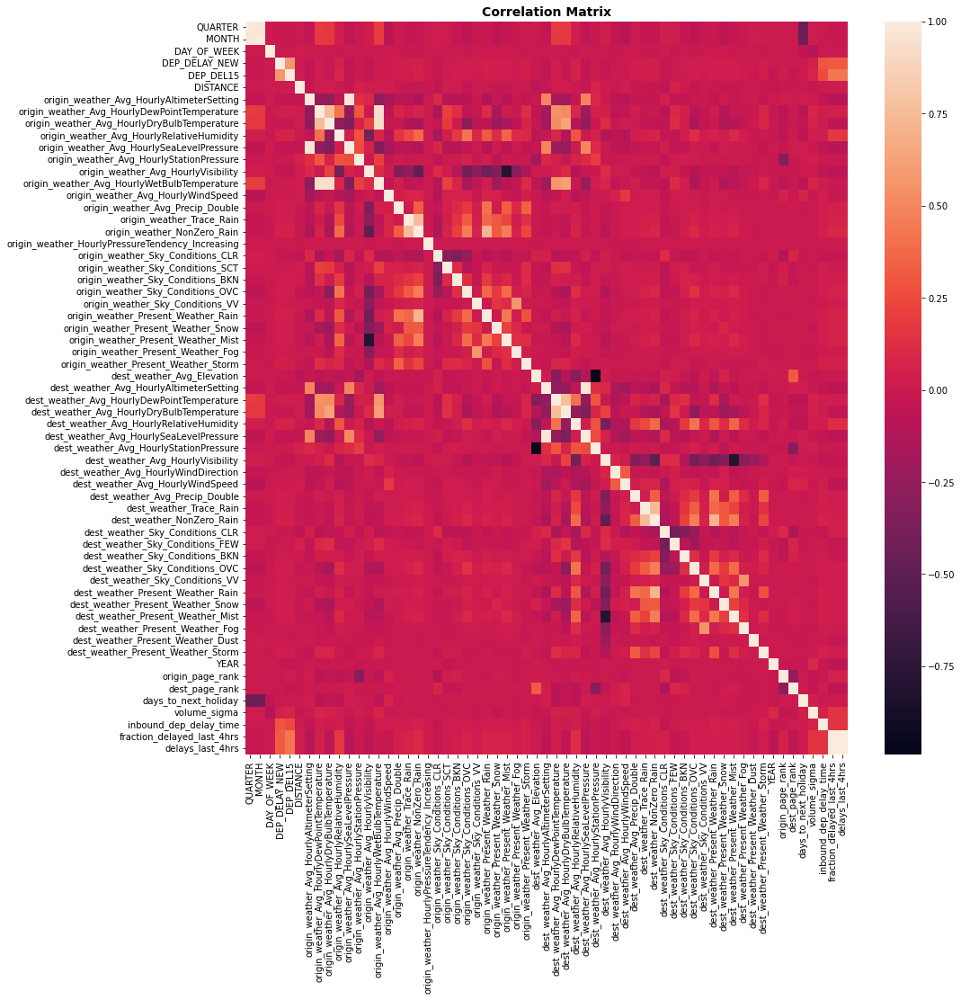

In [0]:
fig, ax = plt.subplots(figsize=(15, 15))
corr_plot = sns.heatmap(corrmatrix, yticklabels=columns, xticklabels=columns)
ax.set_title("Correlation Matrix", fontdict={"fontsize": 14, "fontweight": "bold"})

feature,correlation
origin_weather_Avg_HourlyAltimeterSetting,-0.04905612636141334
origin_weather_Avg_HourlySeaLevelPressure,-0.0467339734384589
dest_weather_Avg_HourlyAltimeterSetting,-0.04624777508372605
dest_weather_Avg_HourlySeaLevelPressure,-0.04340963691205781
origin_weather_Avg_HourlyVisibility,-0.034056586043159545
YEAR,-0.028587208488553457
dest_weather_Avg_HourlyVisibility,-0.02853532222627324
dest_page_rank,-0.026504070723149066
origin_weather_Sky_Conditions_CLR,-0.01654965506546121
dest_weather_Avg_Elevation,-0.014150463908629165


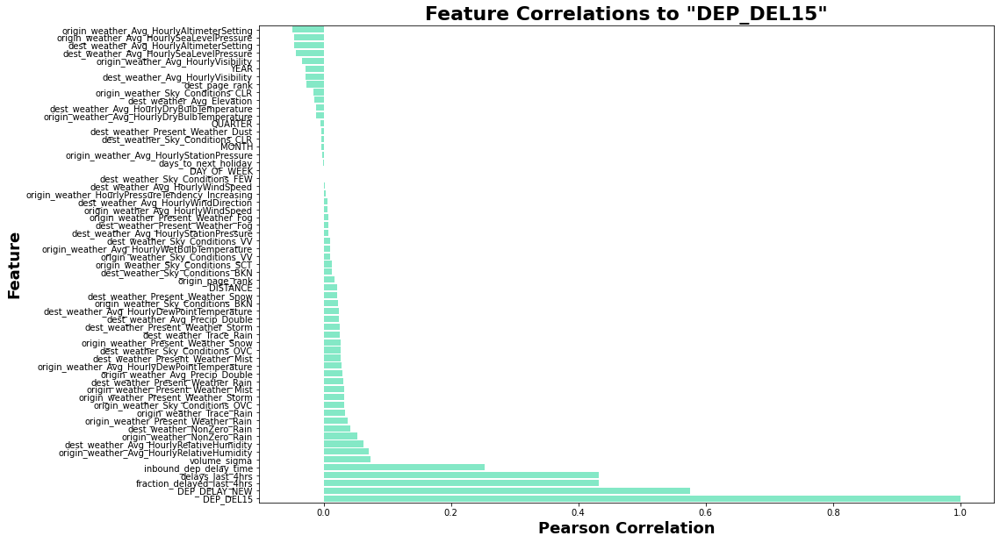

In [0]:
dep_delay_correlations = pd.DataFrame(
    list(zip(columns, corrmatrix[4])), columns=["feature", "correlation"]
)
dep_delay_correlations = dep_delay_correlations[
    ~dep_delay_correlations.feature.isin(
        ["dep_delay_new", "dep_delay", "dep_delay_group", "dep_del15"]
    )
]
dep_delay_correlations.sort_values(by="correlation", inplace=True)
fig, ax = plt.subplots(figsize=(15, 10))
sns.barplot(
    data=dep_delay_correlations, y="feature", x="correlation", color=FOREGROUND, ax=ax
)
ax.set_title(
    'Feature Correlations to "DEP_DEL15"',
    fontdict={"fontsize": 22, "fontweight": "bold"},
)
ax.set_xlabel("Pearson Correlation", fontdict={"fontsize": 18, "fontweight": "bold"})
ax.set_ylabel("Feature", fontdict={"fontsize": 18, "fontweight": "bold"})
display(dep_delay_correlations)

### List of Model Input Family Features

<img src="https://github.com/noriiii/W261_Final_Project_NB/blob/main/SelectedFeaturesFamily.png?raw=true">

There are nineteen (19) input features used in modeling and they belong to the following feature families:
- **Engineered Flight/Airport** (3 features)
- **Arriving/Departing Flight** (1 feature) 
- **Weather** (15 features)

None of the features from Airport of Origin/Destination and Airplane/Airline families were used in modeling, as none of them were found to have strong correlation with the target variable.

In [0]:
# Based on the correlation matrix above, below would be the feature columns we would use for our model.

feature_columns = [
    "delays_last_4hrs",
    "fraction_delayed_last_4hrs",
    "inbound_dep_delay_time",
    "volume_sigma",
    "origin_weather_Avg_HourlyRelativeHumidity",
    "dest_weather_Avg_HourlyRelativeHumidity",
    "origin_weather_NonZero_Rain",
    "dest_weather_NonZero_Rain",
    "origin_weather_Present_Weather_Rain",
    "origin_weather_Trace_Rain",
    "origin_weather_Sky_Conditions_OVC",
    "origin_weather_Present_Weather_Storm",
    "origin_weather_Present_Weather_Mist",
    "dest_weather_Present_Weather_Rain",
    "origin_weather_Avg_HourlyAltimeterSetting",
    "origin_weather_Avg_HourlySeaLevelPressure",
    "dest_weather_Avg_HourlyAltimeterSetting",
    "dest_weather_Avg_HourlySeaLevelPressure",
    "origin_weather_Avg_HourlyVisibility",
]

data = data[feature_columns]

In [0]:
display(data)

delays_last_4hrs,fraction_delayed_last_4hrs,inbound_dep_delay_time,volume_sigma,origin_weather_Avg_HourlyRelativeHumidity,dest_weather_Avg_HourlyRelativeHumidity,origin_weather_NonZero_Rain,dest_weather_NonZero_Rain,origin_weather_Present_Weather_Rain,origin_weather_Trace_Rain,origin_weather_Sky_Conditions_OVC,origin_weather_Present_Weather_Storm,origin_weather_Present_Weather_Mist,dest_weather_Present_Weather_Rain,origin_weather_Avg_HourlyAltimeterSetting,origin_weather_Avg_HourlySeaLevelPressure,dest_weather_Avg_HourlyAltimeterSetting,dest_weather_Avg_HourlySeaLevelPressure,origin_weather_Avg_HourlyVisibility
0.32748538011695905,0.32748538011695905,9.0,-0.2390403360281085,89.0,31.0,0,0,0,0,1,0,0,0,29.98,30.15,30.14,30.15,10.0
0.3298429319371728,0.3298429319371728,8.0,-0.2390403360281085,89.0,77.0,0,0,0,0,1,0,0,0,29.98,30.15,30.32,30.45,10.0
0.367816091954023,0.367816091954023,29.0,-0.2390403360281085,78.75,54.0,1,0,0,1,1,0,0,0,29.99333333333333,30.17,30.06,30.09,4.745
0.5939849624060151,0.5939849624060151,-3.0,-0.2390403360281085,92.0,61.0,1,0,0,0,1,0,1,0,30.03,30.17,30.07,30.08,2.0
0.6,0.6,3.0,-0.2390403360281085,92.0,88.0,1,0,0,0,1,0,1,0,30.03,30.17,30.18,30.17,2.0
0.23809523809523808,0.23809523809523808,74.0,0.3112833187352832,67.0,58.0,0,0,0,0,0,0,0,0,29.89,29.97,29.85,29.8,10.0
0.25287356321839083,0.25287356321839083,15.0,0.3112833187352832,67.0,89.0,0,1,0,0,0,0,0,0,29.89,29.97,30.12,30.12,10.0
0.4457831325301205,0.4457831325301205,8.0,0.3112833187352832,66.0,54.0,0,0,0,0,0,0,0,0,29.85,29.93,30.26,30.29,10.0
0.8947368421052632,0.8947368421052632,-7.0,-0.20042113218506347,83.0,97.0,0,0,0,0,0,0,0,0,30.19,30.37,30.29,30.29,10.0
0.9084507042253521,0.9084507042253521,56.0,-0.20042113218506347,83.0,41.0,0,0,0,0,0,0,0,0,30.19,30.37,30.29,30.3,10.0


In [0]:
dbutils.data.summarize(data)

<!DOCTYPE html>